In [1]:
%pwd

u'/Users/christophereppig/DSI_week3'

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
cars = pd.read_csv('../Datasets/car.csv')

In [4]:
cars.head()

,buying,maint,doors,persons,lug_boot,safety,acceptability
0,vhigh,vhigh,2,2,small,low,unacc
1,vhigh,vhigh,2,2,small,med,unacc
2,vhigh,vhigh,2,2,small,high,unacc
3,vhigh,vhigh,2,2,med,low,unacc
4,vhigh,vhigh,2,2,med,med,unacc


In [5]:
for column in cars.columns:
    print cars[column].value_counts()
    print '\n'

med      432
high     432
low      432
vhigh    432
Name: buying, dtype: int64


med      432
high     432
low      432
vhigh    432
Name: maint, dtype: int64


3        432
5more    432
4        432
2        432
Name: doors, dtype: int64


more    576
4       576
2       576
Name: persons, dtype: int64


med      576
small    576
big      576
Name: lug_boot, dtype: int64


med     576
high    576
low     576
Name: safety, dtype: int64


unacc    1210
acc       384
good       69
vgood      65
Name: acceptability, dtype: int64




In [6]:
from sklearn.preprocessing import LabelEncoder

In [7]:
y = LabelEncoder().fit_transform(cars['acceptability'])
x = pd.get_dummies(cars.drop('acceptability', axis=1))   ## dummies out every column

In [8]:
x.head()

,buying_high,buying_low,buying_med,buying_vhigh,maint_high,maint_low,maint_med,maint_vhigh,doors_2,doors_3,...,doors_5more,persons_2,persons_4,persons_more,lug_boot_big,lug_boot_med,lug_boot_small,safety_high,safety_low,safety_med
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [9]:
from sklearn.cross_validation import cross_val_score, StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier

cv = StratifiedKFold(y, n_folds=3, shuffle=True, random_state=41)


In [10]:
## the high discrepancy in number of counts can be a problem for some models. the cv object above solves this problem.
pd.DataFrame(y)[0].value_counts()

2    1210
0     384
1      69
3      65
Name: 0, dtype: int64

In [11]:
x.head()

,buying_high,buying_low,buying_med,buying_vhigh,maint_high,maint_low,maint_med,maint_vhigh,doors_2,doors_3,...,doors_5more,persons_2,persons_4,persons_more,lug_boot_big,lug_boot_med,lug_boot_small,safety_high,safety_low,safety_med
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [12]:
cv

sklearn.cross_validation.StratifiedKFold(labels=[2 2 2 ..., 2 1 3], n_folds=3, shuffle=True, random_state=41)

In [13]:
dt = DecisionTreeClassifier(class_weight='balanced') ## there are multiple classes in y, we want them to be balanced equally
s = cross_val_score(dt, x, y, cv=cv, n_jobs=-1)

In [14]:
print "{} Score:\t{:0.3} ± {:0.3}".format("Decision Tree", s.mean().round(3), s.std().round(3))

Decision Tree Score:	0.962 ± 0.009


In [15]:
def score(model, name):
    s = cross_val_score(model, x, y, cv=cv, n_jobs=-1)
    print "{} Score:\t{:0.3} ± {:0.3}".format(name, s.mean().round(3), s.std().round(3))

In [16]:
bdt = BaggingClassifier(DecisionTreeClassifier())   ## bagging classifier model object

In [17]:
rf = RandomForestClassifier(class_weight='balanced', n_jobs=-1)   ## random forest model object

In [18]:
et = ExtraTreesClassifier(class_weight='balanced', n_jobs=-1)     ## extra random tree model object

In [19]:
score(dt, "Decision Tree")

Decision Tree Score:	0.962 ± 0.009


In [20]:
score(bdt, "Bagging DT")

Bagging DT Score:	0.969 ± 0.004


In [21]:
score(rf, "Random Forest")

Random Forest Score:	0.95 ± 0.006


In [22]:
score(et, "Extra Trees")

Extra Trees Score:	0.951 ± 0.002


In [23]:
et.fit(x,y)

ExtraTreesClassifier(bootstrap=False, class_weight='balanced',
           criterion='gini', max_depth=None, max_features='auto',
           max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [24]:
predictions= et.predict(x)

In [25]:
from sklearn.metrics import classification_report, confusion_matrix

In [26]:
print confusion_matrix(y, predictions)

[[ 384    0    0    0]
 [   0   69    0    0]
 [   0    0 1210    0]
 [   0    0    0   65]]


In [27]:
print classification_report(y, predictions)

             precision    recall  f1-score   support

          0       1.00      1.00      1.00       384
          1       1.00      1.00      1.00        69
          2       1.00      1.00      1.00      1210
          3       1.00      1.00      1.00        65

avg / total       1.00      1.00      1.00      1728



### ^^ pretty over-fit

#  Boosting

In [28]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

In [29]:
ab = AdaBoostClassifier()
gb = GradientBoostingClassifier()

In [30]:
score(ab, "AdaBoost")

AdaBoost Score:	0.811 ± 0.002


In [31]:
score(gb, "Gradient Boosting Classifier")

Gradient Boosting Classifier Score:	0.982 ± 0.006


# Feature evaluation

In [32]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(cars['acceptability'])
x = pd.get_dummies(cars.drop('acceptability', axis=1))

In [33]:
x.head()

,buying_high,buying_low,buying_med,buying_vhigh,maint_high,maint_low,maint_med,maint_vhigh,doors_2,doors_3,...,doors_5more,persons_2,persons_4,persons_more,lug_boot_big,lug_boot_med,lug_boot_small,safety_high,safety_low,safety_med
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [34]:
from sklearn.cross_validation import cross_val_score, StratifiedKFold
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(max_depth = 3, min_samples_split = 2)

dt.fit(x, y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

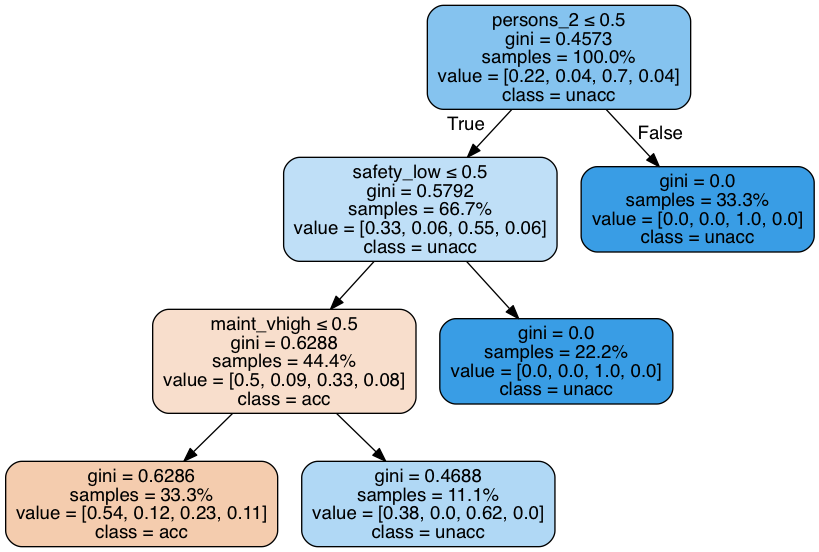

In [35]:
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydot
from IPython.display import Image
dot_data = StringIO()  
export_graphviz(dt, out_file=dot_data,  
                    feature_names=x.columns,  
                    class_names=le.classes_,  
                    filled=True, rounded=True,
                    proportion=True,
                    special_characters=True)  
graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png()) 

In [36]:
feature_importances = pd.DataFrame(dt.feature_importances_,
                                   index = x.columns,
                                    columns=['importance']).sort_values('importance',
                                                                        ascending=False)
feature_importances.head()

,importance
safety_low,0.545239
persons_2,0.363493
maint_vhigh,0.091268
buying_high,0.000000
doors_5more,0.000000


In [37]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier

rf = RandomForestClassifier(class_weight='balanced', n_jobs=-1)
et = ExtraTreesClassifier(class_weight='balanced', n_jobs=-1)

rf.fit(x, y)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [38]:
all(rf.feature_importances_ == np.mean([tree.feature_importances_ for tree in rf.estimators_], axis=0))

True

In [39]:
importances = rf.feature_importances_
# calculate the standard deviation of feature importances by looping over the trees in the random forest
# 
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

indices = np.argsort(importances)[::-1]
feature_names = x.columns



In [40]:
indices

array([12, 17, 18, 19, 20,  1,  7,  2,  5, 15, 16,  4,  6,  3,  0,  8, 13,
       14,  9, 10, 11])

(-1, 21)

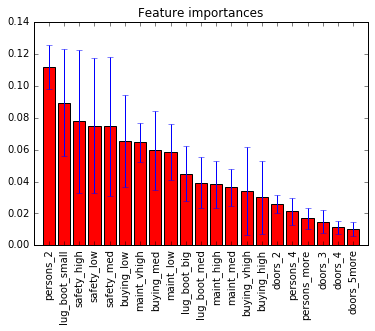

In [43]:
# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(x.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(x.shape[1]), feature_names[indices], rotation=90)
plt.xlim([-1, x.shape[1]])

(-1, 21)

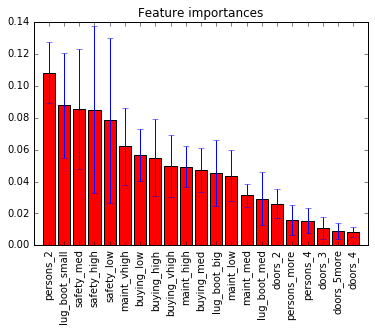

In [44]:
et.fit(x, y)
importances = et.feature_importances_
std = np.std([tree.feature_importances_ for tree in et.estimators_], axis=0)
indices = np.argsort(importances)[::-1]
feature_names = x.columns
# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(x.shape[1]), importances[indices],
        color="r", yerr=std[indices], align="center")
plt.xticks(range(x.shape[1]), feature_names[indices], rotation=90)
plt.xlim([-1, x.shape[1]])

In [46]:
dot_data = StringIO()
export_graphviz(rf.estimators_[0], out_file=dot_data,
               feature_names=x.columns,
               class_names=le.classes_,
               filled=True, rounded=True,
               proportion=True,
               special_characters=True)
graph = pydot.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())